# Processamento de Imagem Digital

## Trabalho 2

### Introdução

O trabalho tem por objetivo implementar técnicas de filtragem e compressão utilizando o domínio da frequência de imagens digitais.

Técnicas de compressão visam encontrar representações suficientemente boas de imagens digitais que ocupem menos espaço em disco.

Técnicas de filtragem, por outro lado, visam alterar a imagem de maneira a obter uma imagem mais interessante para alguma finalidade. Exemplos comuns são remover ruídos, exacerbar contornos a fim de facilitar a identificação de objetos, aumentar constraste na imagem e borrar uma imagem.

Para ambas as técnicas, existem abordagens que exploram o domínio de frequência das imagens.


### Preparação

#### Requisitos

In [7]:
# Conetando ao google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# Importando pacotes que serão utilizados
import cv2
import numpy as np
import numpy.typing as npt
from google.colab.patches import cv2_imshow

#### Imagens

Serão utilizadas todas as imagens disponibilizadas pelo professor em seu [repositório de imagens png](https://www.ic.unicamp.br/~helio/imagens_png/).

In [9]:
# Carregando imagem do drive em escala de cinza
images = {
    "baboon": cv2.imread("/content/drive/MyDrive/MC920/T2/baboon.png", cv2.IMREAD_GRAYSCALE),
    "baboon_perspective": cv2.imread("/content/drive/MyDrive/MC920/T2/baboon_perspective.png", cv2.IMREAD_GRAYSCALE),
    "butterfly": cv2.imread("/content/drive/MyDrive/MC920/T2/butterfly.png", cv2.IMREAD_GRAYSCALE),
    "city": cv2.imread("/content/drive/MyDrive/MC920/T2/city.png", cv2.IMREAD_GRAYSCALE),
    "house": cv2.imread("/content/drive/MyDrive/MC920/T2/house.png", cv2.IMREAD_GRAYSCALE),
    "seagull": cv2.imread("/content/drive/MyDrive/MC920/T2/seagull.png", cv2.IMREAD_GRAYSCALE),
}

for name, image in images.items():
    print(f"Imagem `{name}` tem dimensões {image.shape} e tons de cinza armazenados em inteiros {image.dtype}")

Imagem `baboon` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `baboon_perspective` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `butterfly` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `city` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `house` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8
Imagem `seagull` tem dimensões (512, 512) e tons de cinza armazenados em inteiros uint8


A principal imagem utiliza será a "baboon", de modo a facilitar comparações com o enunciado do trabalho.

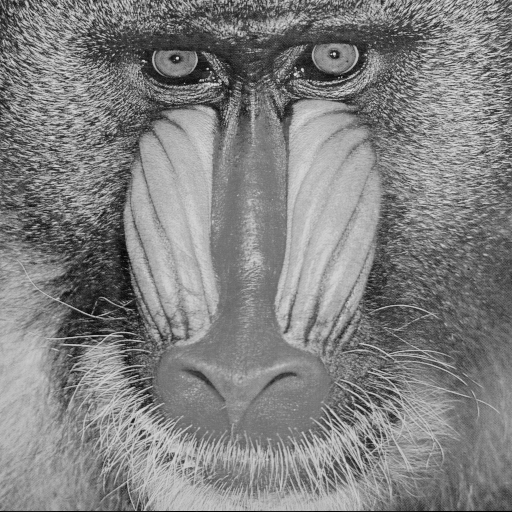

In [10]:
cv2_imshow(images["baboon"])

### Racional

Assim como um áudio, uma imagem é um sinal.

Um artifício matemático poderoso em processamento de sinais é identificar que é possível utilizar transformadas que possuem inversa para resolver problemas. Ou seja, é possível aplicar a transformada para alterar o domínio do sinal, resolver o problema que é mais fácil neste novo domínio e recuperar a solução através da transformada inversa.

Uma transformada integral notória que satisfaz tal critério é a transformada de Fourier. Tal transformada propõe expressar uma função em termos de funções de base sinusoidal. Aplicada a sinais, esta transformada é chamada de representação do domínio da frequência do sinal original.

A representação no domínio de frequência para uma imagem digital é dada por:

$F(u, v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y)e^{
-i2π(ux/M+vy/N)} $

Algumas caracteristicas importantes que podem ser exploradas no domínio de frequência de uma imagem são que:

- Baixas frequências são relacionadas a componentes de variação lenta. Ou seja, texturas homogêneas como paredes, céu sem nuvens e etc.
- Altas frequências são causadas por transições abruptas de intensidade, como bordas e ruídos.

### Filtragem

Dessa forma, primeiro convertemos a imagem para o domínio de frequência centralizando a origem para possibilitar a construção de filtros isotrópicos.

A representação no domínio da frequência é complexa e apresenta característica de exponenciação como é possível observar na equação base. Dessa maneira, para "visualizar" o espectro de frequência podemos extrair o logarítimo natural do módulo da representação da frequência. Por último, para contornar o baixo contraste desta representação e possibilitar a visualização, nós aumentamos o contrate através de uma transformada linear maximizando o contraste para imagens com pixeis de 8 bits.

In [11]:
def normalize_frequency(image: npt.NDArray) -> npt.NDArray:
    normalized = np.log(np.absolute(image) + 1) # "+1" avoids undefined log

    return normalized

In [12]:
def maximize_image_contrast(image: npt.NDArray) -> npt.NDArray:
    max_contrast_image = (image - image.min()) * (np.iinfo(np.uint8).max/(image.max()-image.min()))

    return max_contrast_image

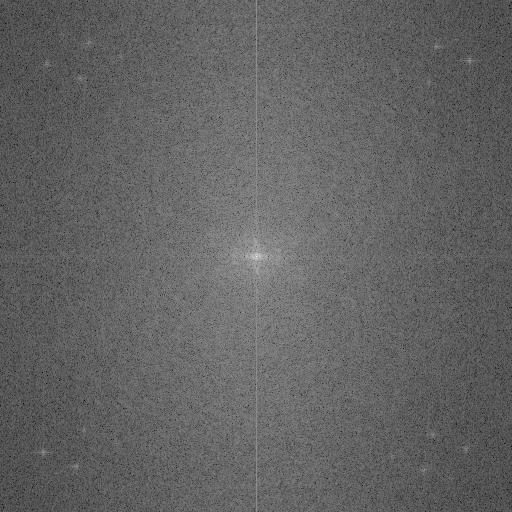

In [13]:
freq = np.fft.fftshift(np.fft.fft2(images["baboon"]))

normalized_freq = normalize_frequency(freq)
normalized_freq_with_contrast = maximize_image_contrast(normalized_freq)

cv2_imshow(normalized_freq_with_contrast.astype(np.uint8))

Notando que no domínio da frequência as menores frequências estão centralizadas, é possível projetar um filtro passa baixa isotrópico utilizando um circulo com valores 1 em um fundo com valores 0. Por outro lado, um filtro passa alta isotrópico pode ser um circulo com valores 0 em um fundo com valores 1.

In [14]:
def build_mask(shape: tuple[int,...], radius: int, thickness: int) -> npt.NDArray:
    center = tuple([dim//2 for dim in shape])
    color = 1

    mask = np.zeros(shape, dtype=np.uint8)
    mask = cv2.circle(mask, center, radius, color, thickness)

    return mask

In [15]:
low_pass = build_mask(images["baboon"].shape, 50, -1)
band_pass = build_mask(images["baboon"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

visible_low_pass = maximize_image_contrast(low_pass)
visible_band_pass = maximize_image_contrast(band_pass)
visible_high_pass = maximize_image_contrast(high_pass)
visible_bandstop = maximize_image_contrast(bandstop)

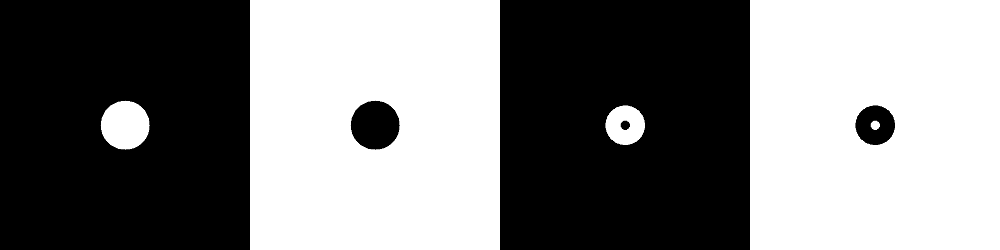

In [16]:
masks_image = np.hstack((visible_low_pass, visible_high_pass, visible_band_pass, visible_bandstop))
cv2_imshow(masks_image)

Da esquerda para a direita temos, portanto, filtros:

1. passa baixa
2. passa alta
3. passa faixa
4. rejeita faixa

O resultado da aplicação do filtro, no domínio da frequência também pode ser visualizado.

In [17]:
filtered_low_pass = low_pass * freq
filtered_band_pass = band_pass * freq
filtered_high_pass = high_pass * freq
filtered_bandstop = bandstop * freq

normalized_filtered_low_pass = normalize_frequency(filtered_low_pass)
normalized_filtered_band_pass = normalize_frequency(filtered_band_pass)
normalized_filtered_high_pass = normalize_frequency(filtered_high_pass)
normalized_filtered_bandstop = normalize_frequency(filtered_bandstop)

normalized_filtered_low_pass_with_contrast = maximize_image_contrast(normalized_filtered_low_pass)
normalized_filtered_band_pass_with_contrast = maximize_image_contrast(normalized_filtered_band_pass)
normalized_filtered_high_pass_with_contrast = maximize_image_contrast(normalized_filtered_high_pass)
normalized_filtered_bandstop_with_contrast = maximize_image_contrast(normalized_filtered_bandstop)

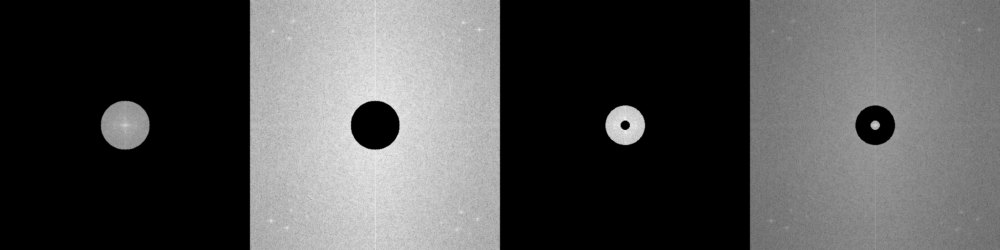

In [18]:
applied_masks_image = np.hstack((
    normalized_filtered_low_pass_with_contrast,
    normalized_filtered_high_pass_with_contrast,
    normalized_filtered_band_pass_with_contrast,
    normalized_filtered_bandstop_with_contrast,
))
cv2_imshow(applied_masks_image)

Por último, a aplicação do filtro tem seu valor máximo quando visualizamos o resultado da filtragem no domínio espacial.

In [19]:
result_low_pass = np.absolute(np.fft.ifft2(np.fft.fftshift(filtered_low_pass))).astype(np.uint8)
result_band_pass = np.absolute(np.fft.ifft2(np.fft.fftshift(filtered_band_pass))).astype(np.uint8)
result_high_pass = np.absolute(np.fft.ifft2(np.fft.fftshift(filtered_high_pass))).astype(np.uint8)
result_bandstop = np.absolute(np.fft.ifft2(np.fft.fftshift(filtered_bandstop))).astype(np.uint8)

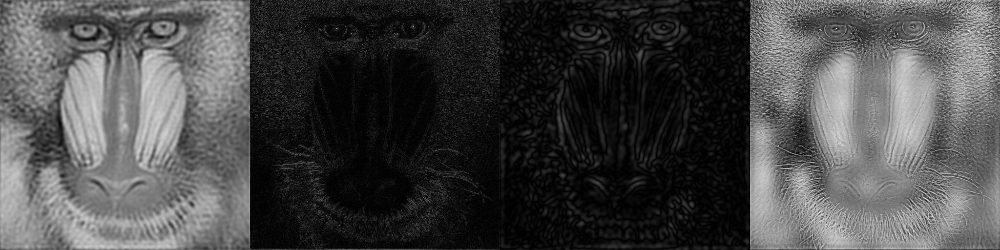

In [20]:
results_image = np.hstack((result_low_pass, result_high_pass, result_band_pass, result_bandstop))
cv2_imshow(results_image)

Visualizando todos os resultados conjuntamente, temos:

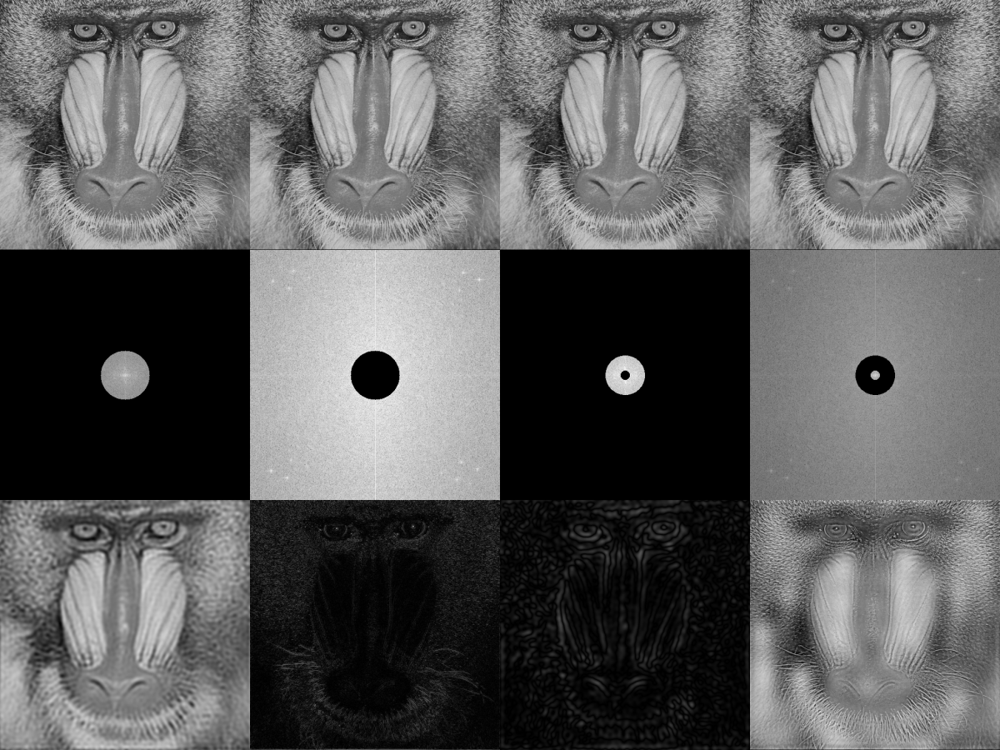

In [21]:
originals_image = np.hstack((images["baboon"], images["baboon"], images["baboon"], images["baboon"]))
composition = np.vstack((originals_image, applied_masks_image, results_image))
resized_composition = cv2.resize(composition, (1200,900), interpolation=cv2.INTER_AREA)

cv2_imshow(resized_composition)

### Compressão

Outra aplicação comum para a transformada de Fourier é adotar os coeficientes de maior magnitude como uma aproximação para o sinal, uma vez que com alguns poucos coeficientes, o comportamento do sinal estará bem representado.

Físicos, por exemplo, utilizam aproximações com a transformada de Fourier para modelar, com razoavel precisão, fenômenos ondulatórios no tempo ou até mesmo a distribuição eletrônica em sólidos no espaço.

No contexto de processamento de imagem digital, o que queremos é reduzir a entropia da imagem, de maneira a possibilitar maior taxa de compressão.

Portanto, utilizaremos o seguinte algoritmo:

1. Aplicar a transformada de Fourier (centralizada por conveniência).
2. Definir um limiar a partir do qual as magnitudes serão aceitas.
3. Zerar todos os coeficientes menores do que este limiar.
4. Aplicar a transformada de Fourier inversa e visualizar a imagem e seu histograma.

In [38]:
print(f"min: {freq.min()}, max: {freq.max()}, mean: {freq.mean()}, std: {freq.std()}")

freq_magnitude = np.absolute(freq)
threshold_90 = np.percentile(freq_magnitude, 90)
threshold_95 = np.percentile(freq_magnitude, 95)
threshold_99 = np.percentile(freq_magnitude, 99)
threshold_999 = np.percentile(freq_magnitude, 99.9)

print(f"percentile\n90%: {threshold_90}\n95%: {threshold_95}\n99%: {threshold_99}\n99.9%: {threshold_999}")

min: (-1353992.817509374+214424.0641697945j), max: (33846792+0j), mean: (145.00000000000003+1.8207657603852567e-14j), std: 69566.05060659978
percentile
90%: 21385.131405547156
95%: 29084.42196013378
99%: 55232.046482279264
99.9%: 169367.9328738759


Acima exibimos algumas estatísticas aplicadas a imagem do babuíno e definimos diferentes limiares para teste.

Abaixo iremos aplicar o algoritmo mencionado e visualizar as imagens.

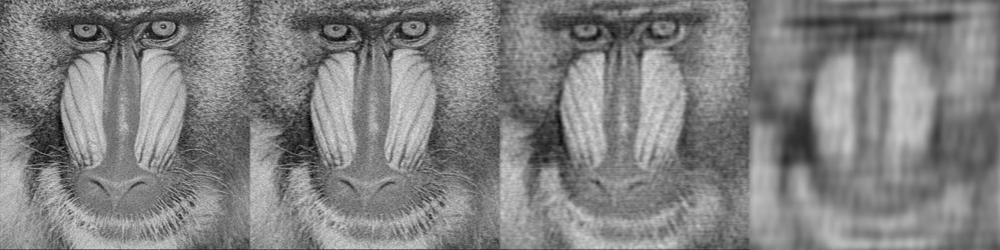

In [39]:
compressed_freq_90 = np.where(freq_magnitude > threshold_90, freq, 0)
compressed_freq_95 = np.where(freq_magnitude > threshold_95, freq, 0)
compressed_freq_99 = np.where(freq_magnitude > threshold_99, freq, 0)
compressed_freq_999 = np.where(freq_magnitude > threshold_999, freq, 0)

compressed_90 = np.absolute(np.fft.ifft2(np.fft.fftshift(compressed_freq_90))).astype(np.uint8)
compressed_95 = np.absolute(np.fft.ifft2(np.fft.fftshift(compressed_freq_95))).astype(np.uint8)
compressed_99 = np.absolute(np.fft.ifft2(np.fft.fftshift(compressed_freq_99))).astype(np.uint8)
compressed_999 = np.absolute(np.fft.ifft2(np.fft.fftshift(compressed_freq_999))).astype(np.uint8)

compressed_composition = np.hstack((compressed_90, compressed_95, compressed_99, compressed_999))

cv2_imshow(compressed_composition)

É notória a perda de qualidade zerando 99.9% dos coeficientes, mas a imagem mantém bons detalhes zerando 95% dos coeficientes ou menos.

Agora, analisando os histogramas da imagem original contra a imagem comprimida:

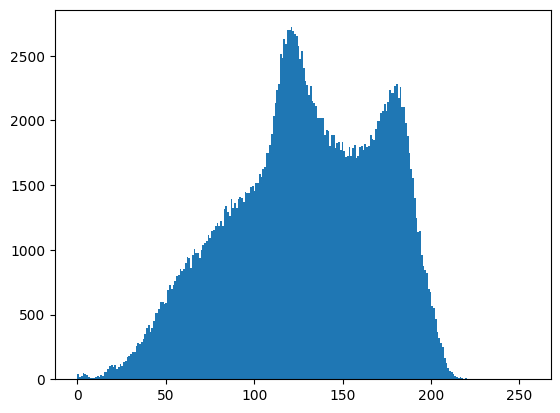

In [47]:
import matplotlib.pyplot as plt

bin_counts, bin_edges, patches = plt.hist(images["baboon"].ravel(), bins=256, range=(0,255))

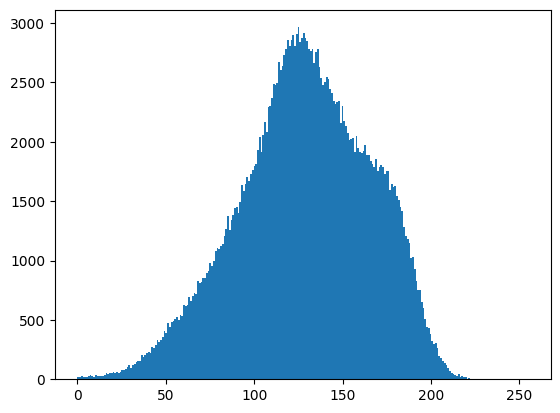

In [49]:
bin_counts, bin_edges, patches = plt.hist(compressed_95.ravel(), bins=256, range=(0,255))

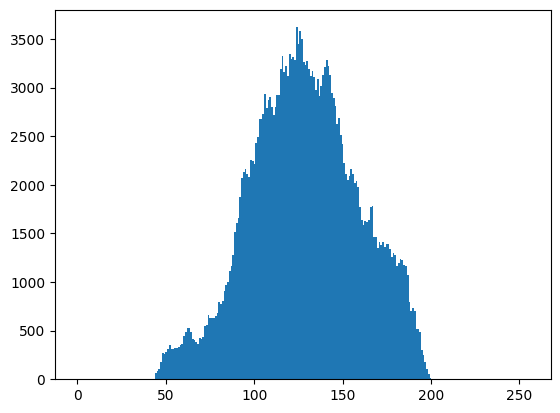

In [48]:
bin_counts, bin_edges, patches = plt.hist(compressed_999.ravel(), bins=256, range=(0,255))

É possível notar uma clara redução no contraste conforme aumentamos o limiar, porém testes a posteriori com algoritmos de compressão seriam necessários para determinar a capacidade de redução no tamanho necessário para armazenar a imagem.

### Experimentos

Empacotando as técnicas exploradas temos:

In [50]:
class ImageFFTFilter:
    def _spatial_to_frequency(self, spat: npt.NDArray) -> npt.NDArray:
        freq = np.fft.fftshift(np.fft.fft2(spat))

        return freq

    def _frequency_to_spatial(self, freq: npt.NDArray) -> npt.NDArray:
        spat = np.absolute(np.fft.ifft2(np.fft.ifftshift(freq)))

        return spat

    def image_spectrum(self, image: npt.NDArray) -> None:
        freq = self._spatial_to_frequency(image)

        normalized_freq = normalize_frequency(freq)
        visible_freq = maximize_image_contrast(normalized_freq)

        return visible_freq.astype(np.uint8)

    def apply_mask(self, image: npt.NDArray, mask: npt.NDArray) -> npt.NDArray:
        assert image.shape == mask.shape, "Mask not adequate to image shape"

        freq = self._spatial_to_frequency(image)
        filtered = self._frequency_to_spatial(freq * mask)

        return filtered.astype(np.uint8)

In [58]:
filter = ImageFFTFilter()

def experiment(image, mask):
    filtered_image = filter.apply_mask(image, mask)
    spectrum = filter.image_spectrum(image)
    normalized_mask = maximize_image_contrast(mask)

    cv2_imshow(np.hstack((image, normalized_mask, filtered_image)))

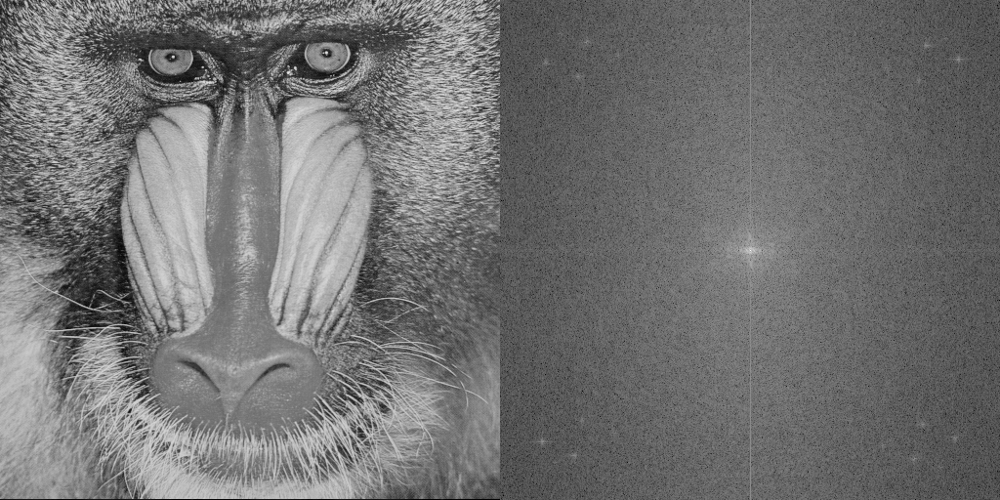

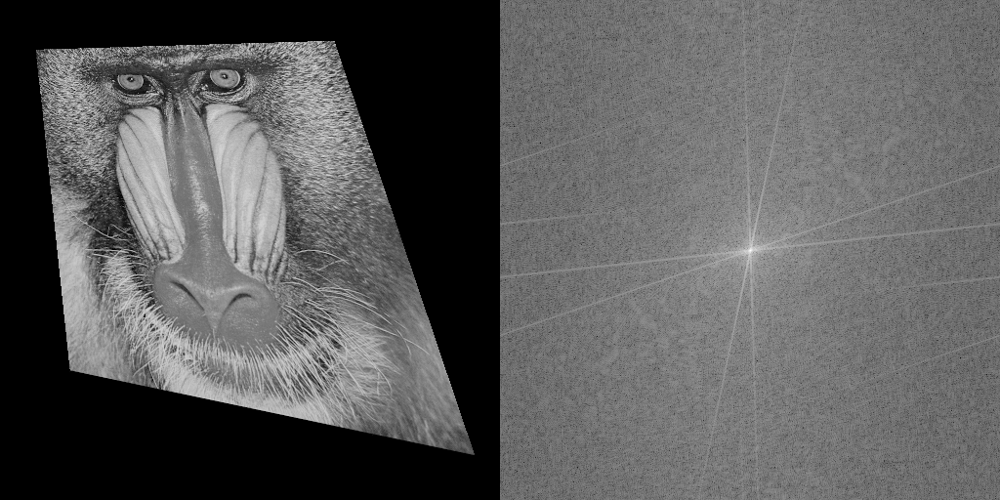

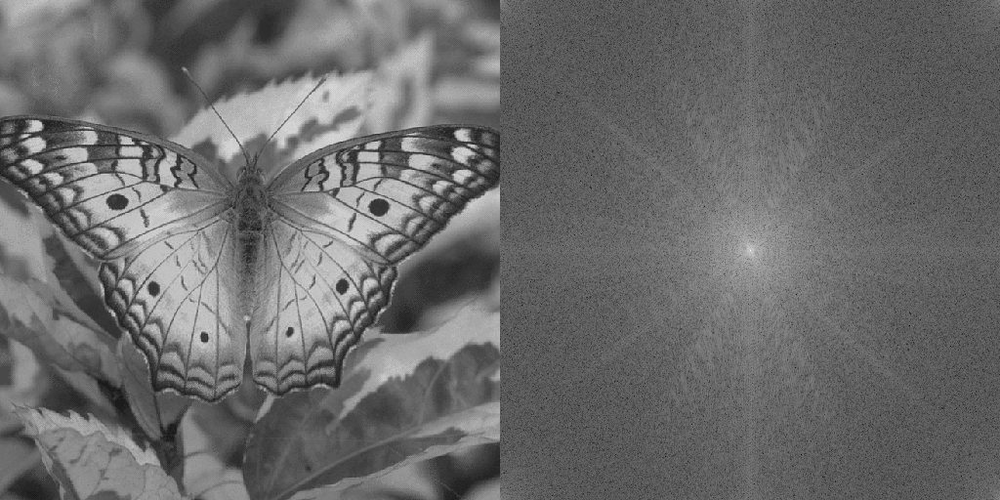

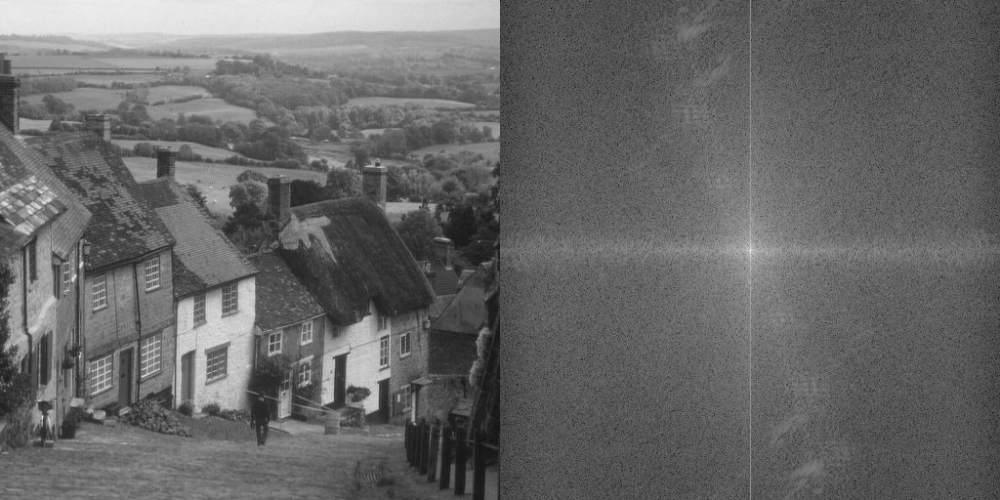

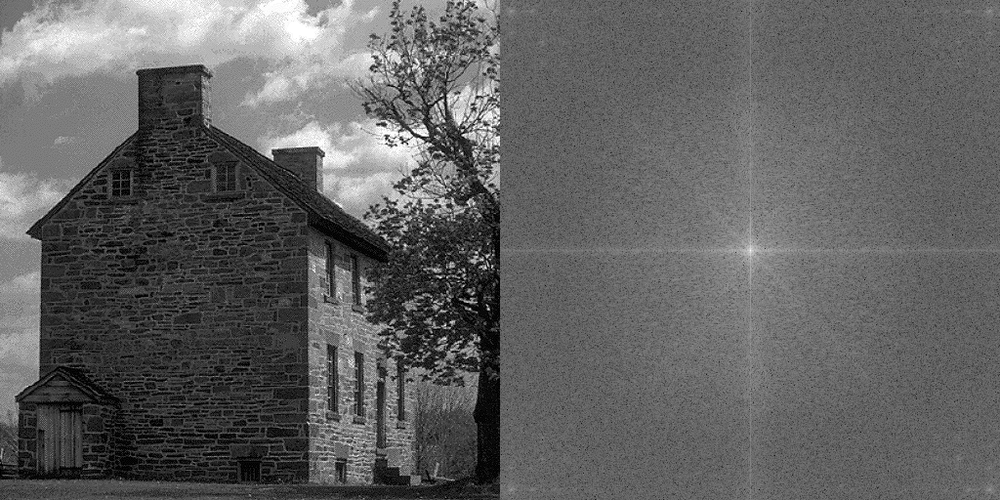

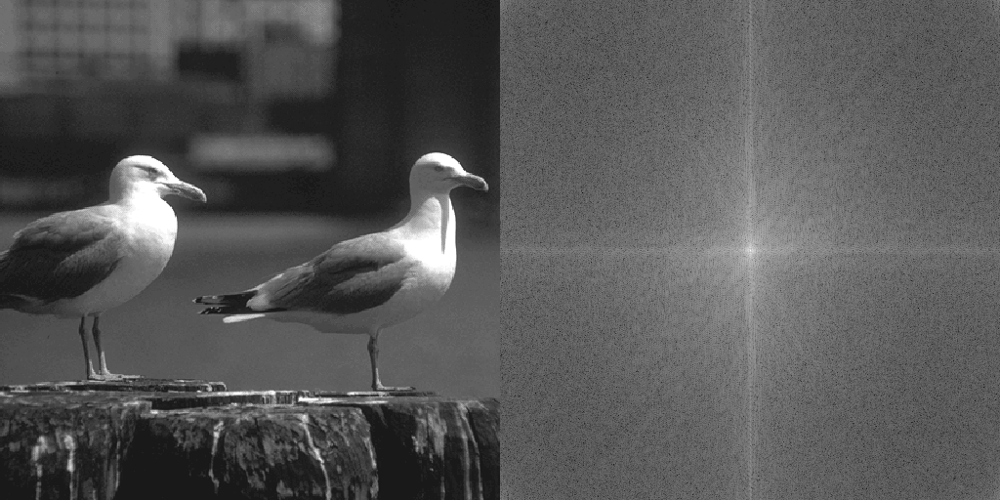

In [56]:
for name, image in images.items():
    spectrum = filter.image_spectrum(image)
    cv2_imshow(np.hstack((image, spectrum)))

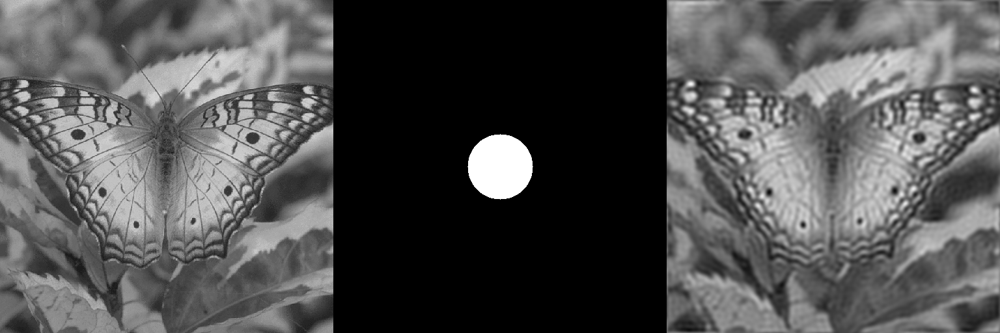

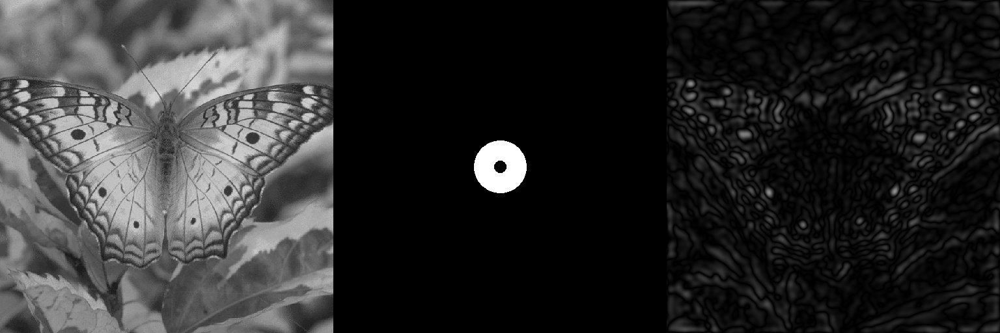

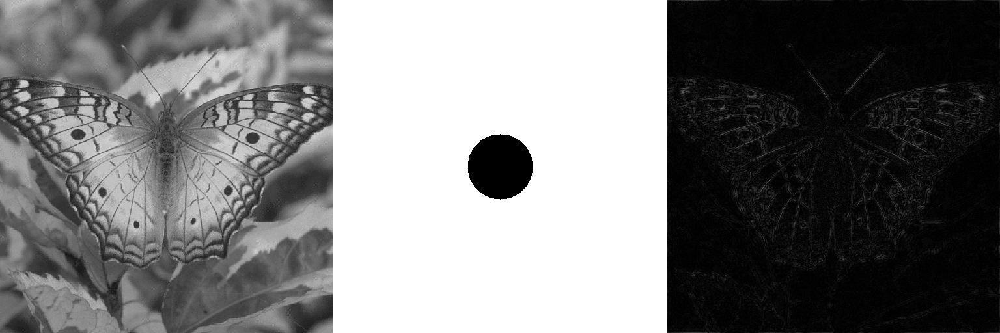

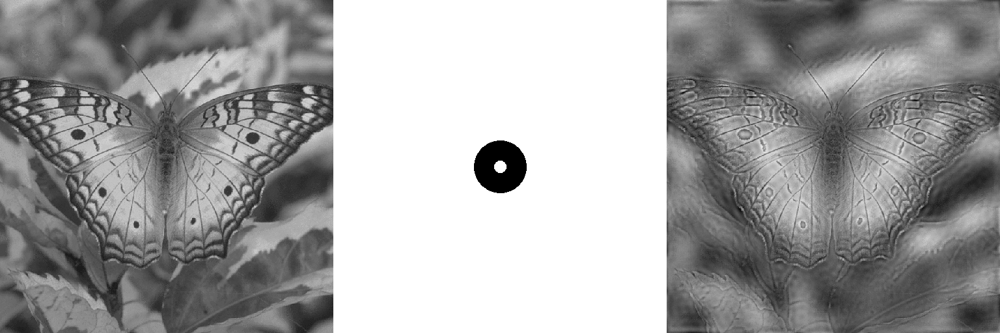

In [59]:
low_pass = build_mask(images["butterfly"].shape, 50, -1)
band_pass = build_mask(images["butterfly"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

experiment(images["butterfly"], low_pass)
experiment(images["butterfly"], band_pass)
experiment(images["butterfly"], high_pass)
experiment(images["butterfly"], bandstop)

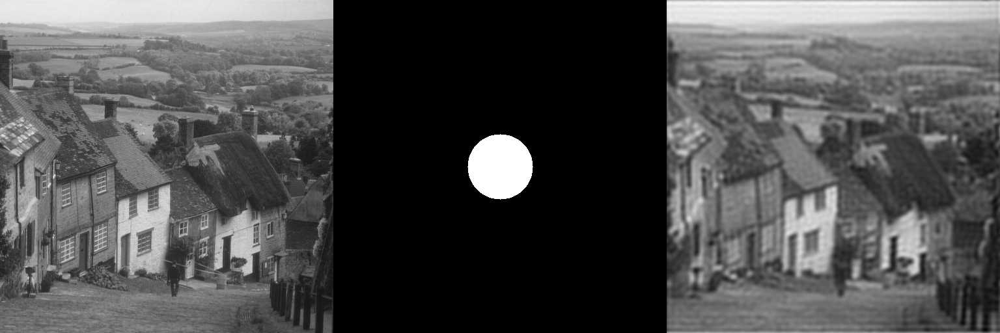

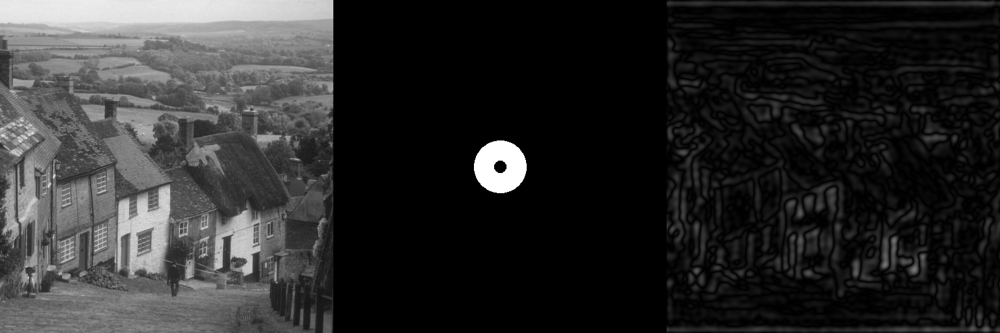

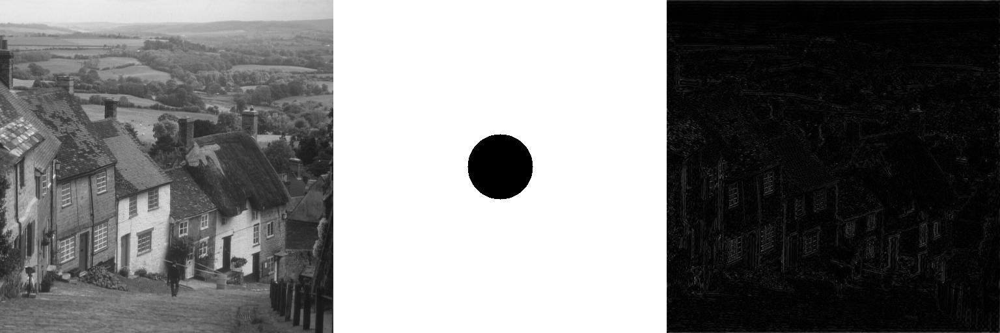

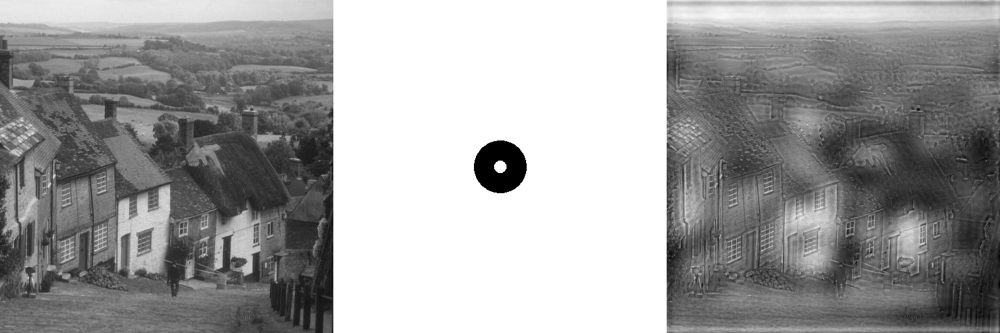

In [60]:
low_pass = build_mask(images["city"].shape, 50, -1)
band_pass = build_mask(images["city"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

experiment(images["city"], low_pass)
experiment(images["city"], band_pass)
experiment(images["city"], high_pass)
experiment(images["city"], bandstop)

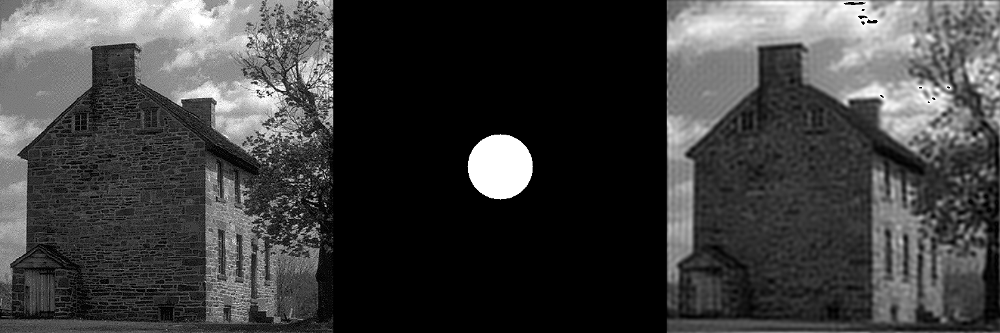

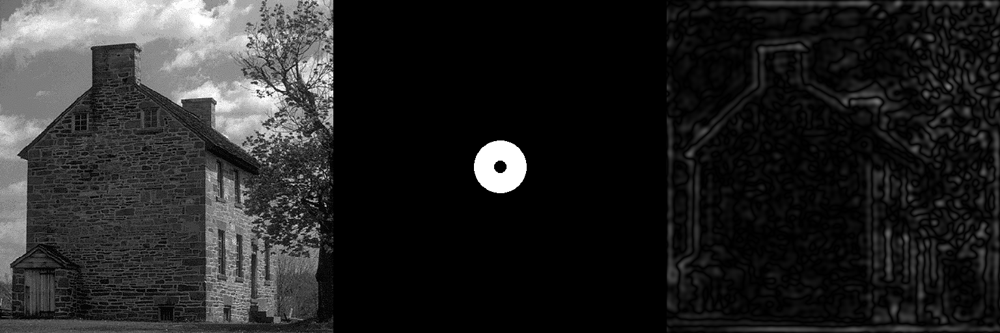

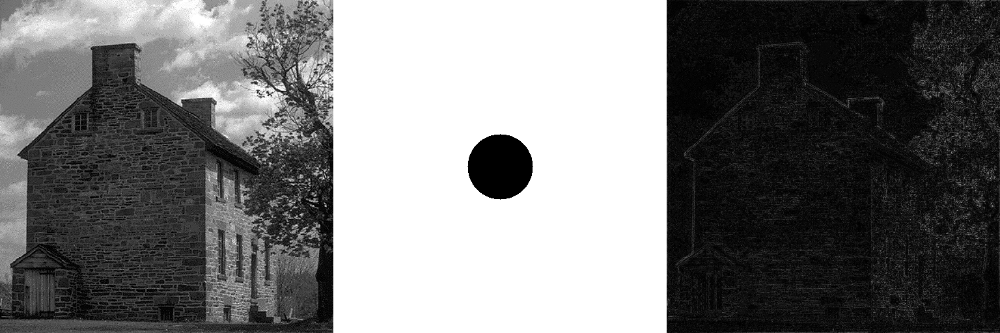

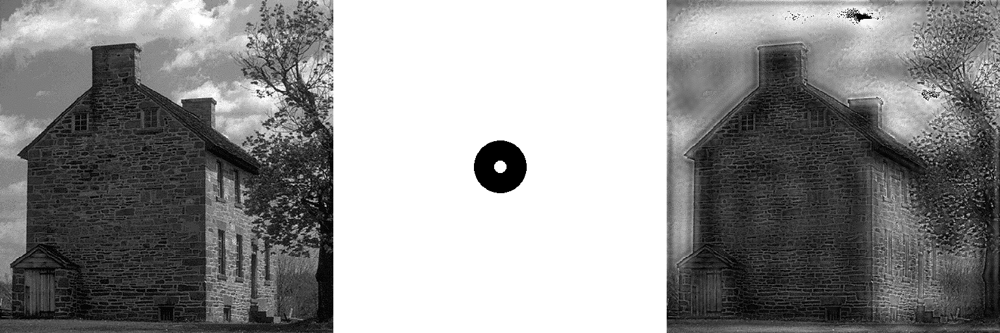

In [61]:
low_pass = build_mask(images["house"].shape, 50, -1)
band_pass = build_mask(images["house"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

experiment(images["house"], low_pass)
experiment(images["house"], band_pass)
experiment(images["house"], high_pass)
experiment(images["house"], bandstop)

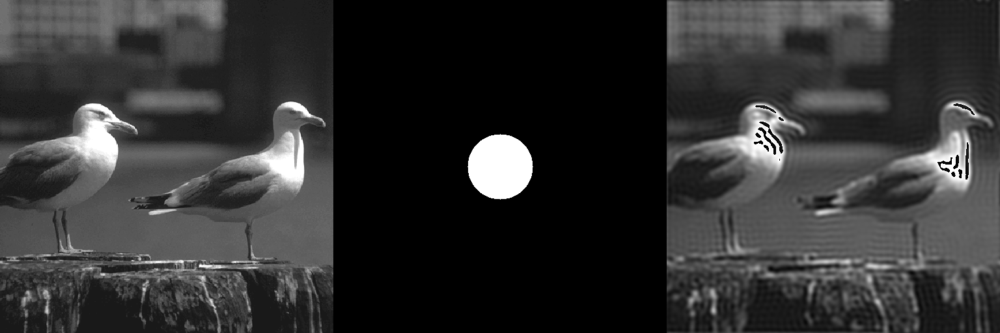

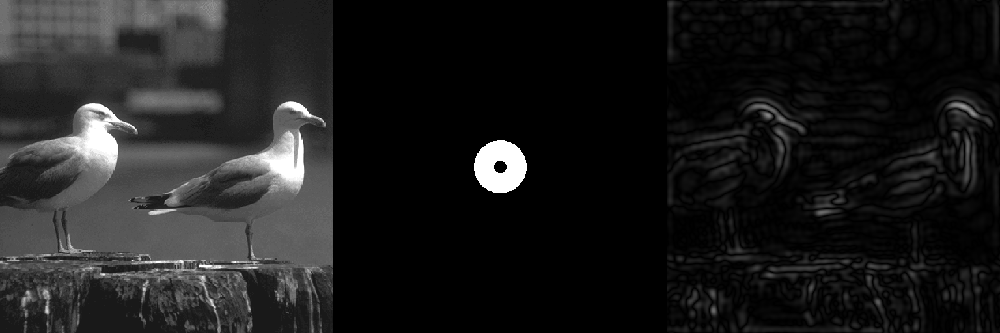

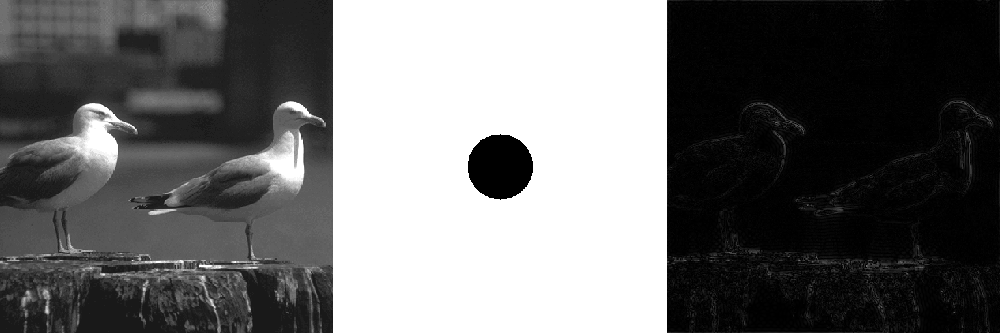

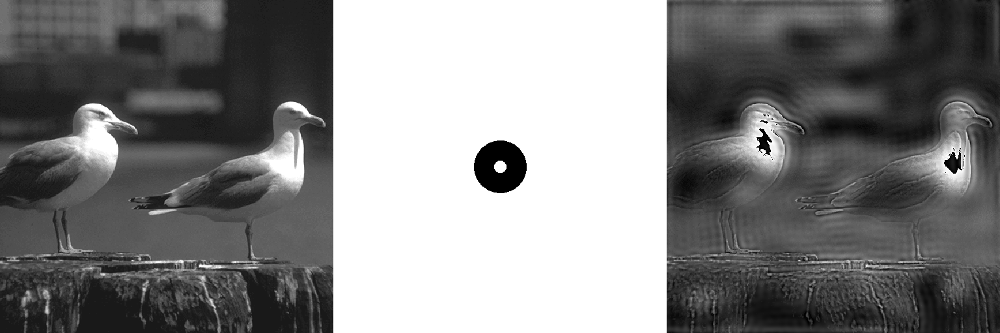

In [62]:
low_pass = build_mask(images["seagull"].shape, 50, -1)
band_pass = build_mask(images["seagull"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

experiment(images["seagull"], low_pass)
experiment(images["seagull"], band_pass)
experiment(images["seagull"], high_pass)
experiment(images["seagull"], bandstop)

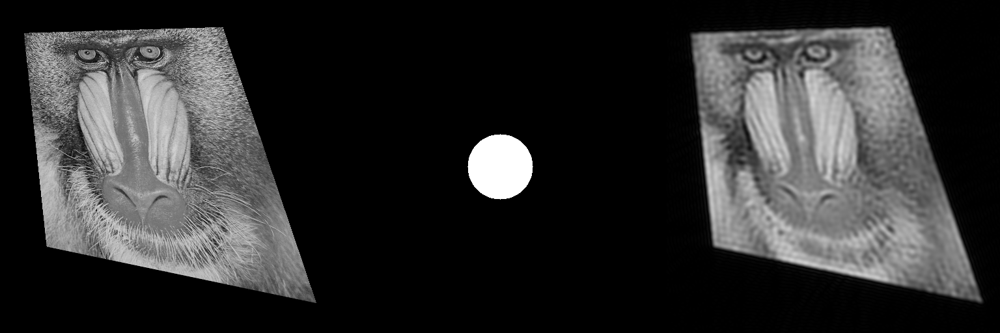

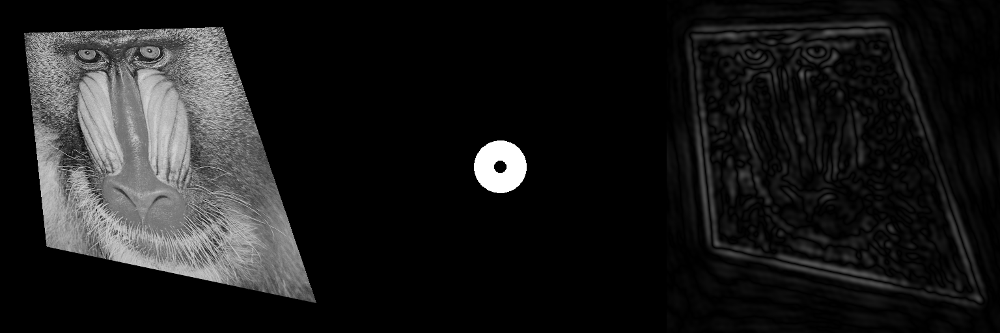

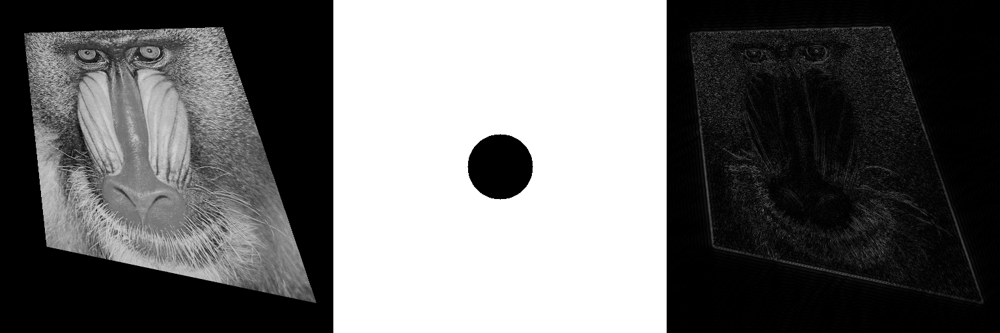

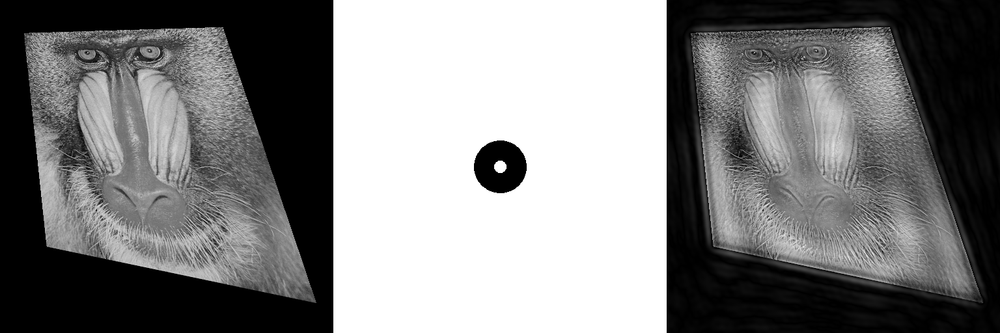

In [63]:
low_pass = build_mask(images["baboon_perspective"].shape, 50, -1)
band_pass = build_mask(images["baboon_perspective"].shape, 25, 30)
high_pass = np.where(low_pass == 1, 0, 1)
bandstop = np.where(band_pass == 1, 0, 1)

experiment(images["baboon_perspective"], low_pass)
experiment(images["baboon_perspective"], band_pass)
experiment(images["baboon_perspective"], high_pass)
experiment(images["baboon_perspective"], bandstop)

Todos os experimentos agregam na construção de uma intuição a cerca dos filtros. Algumas conclusões são:

1. De fato filtros passa baixa tendem a borrar a imagem, como previsto teóricamente.
2. De fato filtros passa alta tendem a ressaltar contornos, como previsto teóricamente.
3. Filtros passa faixa com limiares similares aos escolhidos tendem a ressaltar regiões próximas a contornos, mas sem grande definição.
4. Filtros rejeita faixa com limiares similares aos escolhidos tendem manter contornos, mas empobrecer bastante o nível de detalhes.
5. Filtros passa faixa e rejeita faixa com limiares similares aos escolhidos tendem introduzir distorções nas imagens, como pode-se observar claramente no caso da imagem do babuíno em perspectiva, na qual distorções aparecem fora da área originalmente coberta pela imagem.

### Conclusão

O domínio da frequência das imagens é de extrema utilidade para tarefas de processamento de imagem digital.

Tarefas como filtragem isotrópica são extremamente difíceis e custosas no domínio do espaço, porém muito eficazes e eficientes quando realizadas no domínio da frequência.

Filtros passa baixa são exemplos de filtros isotrópicos com efeito de borrar a imagem e filtros passa alta são exemplos de filtros isotrópicos com efeito de destaque de contornos. Ambas são tarefas bastante difíceis de se realizar no domínio do espaço, mas razoavelmente simples no domínio da frequência e geram resultados muito interessantes.

Além das tarefas relacionadas a filtragem, existem outras aplicações para o domínio da frequência das imagens. Um exemplo interessante é a compressão, na qual aproximasse o sinal da imagem pelos termos de maior magnitude da transformada de Fourier, permitindo boa transmissão de detalhes com uma entropia bem menor.